In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
pd.set_option('display.max_rows', 10000)

In [2]:
df=pd.read_csv('Bengaluru_House_Data.csv')

In [3]:
df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price
0,Super built-up Area,19-Dec,Electronic City Phase II,2 BHK,Coomee,1056,2.0,1.0,39.07
1,Plot Area,Ready To Move,Chikka Tirupathi,4 Bedroom,Theanmp,2600,5.0,3.0,120.00
2,Built-up Area,Ready To Move,Uttarahalli,3 BHK,NaN,1440,2.0,3.0,62.00
3,Super built-up Area,Ready To Move,Lingadheeranahalli,3 BHK,Soiewre,1521,3.0,1.0,95.00
4,Super built-up Area,Ready To Move,Kothanur,2 BHK,NaN,1200,2.0,1.0,51.00


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13320 entries, 0 to 13319
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   area_type     13320 non-null  object 
 1   availability  13320 non-null  object 
 2   location      13319 non-null  object 
 3   size          13304 non-null  object 
 4   society       7818 non-null   object 
 5   total_sqft    13320 non-null  object 
 6   bath          13247 non-null  float64
 7   balcony       12711 non-null  float64
 8   price         13320 non-null  float64
dtypes: float64(3), object(6)
memory usage: 936.7+ KB


In [5]:
df1=df.drop(['area_type','availability','society','balcony'],axis=1)

In [6]:
df1['size'].unique()

array(['2 BHK', '4 Bedroom', '3 BHK', '4 BHK', '6 Bedroom', '3 Bedroom',
       '1 BHK', '1 RK', '1 Bedroom', '8 Bedroom', '2 Bedroom',
       '7 Bedroom', '5 BHK', '7 BHK', '6 BHK', '5 Bedroom', '11 BHK',
       '9 BHK', nan, '9 Bedroom', '27 BHK', '10 Bedroom', '11 Bedroom',
       '10 BHK', '19 BHK', '16 BHK', '43 Bedroom', '14 BHK', '8 BHK',
       '12 Bedroom', '13 BHK', '18 Bedroom'], dtype=object)

In [7]:
df1.isnull().sum()

location       1
size          16
total_sqft     0
bath          73
price          0
dtype: int64

In [8]:
df2=df1.dropna()

In [9]:
df2.head()

,location,size,total_sqft,bath,price
0,Electronic City Phase II,2 BHK,1056,2.0,39.07
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00
2,Uttarahalli,3 BHK,1440,2.0,62.00
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00
4,Kothanur,2 BHK,1200,2.0,51.00


In [10]:
def size_1(size):
    new_size=size.split()[0]
    return float(new_size)

In [11]:
df2['bhk']=df2['size'].apply(size_1)

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\2855370190.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['bhk']=df2['size'].apply(size_1)


In [12]:
df2

,location,size,total_sqft,bath,price,bhk
0,Electronic City Phase II,2 BHK,1056,2.0,39.07,2.0
1,Chikka Tirupathi,4 Bedroom,2600,5.0,120.00,4.0
2,Uttarahalli,3 BHK,1440,2.0,62.00,3.0
3,Lingadheeranahalli,3 BHK,1521,3.0,95.00,3.0
4,Kothanur,2 BHK,1200,2.0,51.00,2.0
...,...,...,...,...,...,...
13315,Whitefield,5 Bedroom,3453,4.0,231.00,5.0
13316,Richards Town,4 BHK,3600,5.0,400.00,4.0
13317,Raja Rajeshwari Nagar,2 BHK,1141,2.0,60.00,2.0
13318,Padmanabhanagar,4 BHK,4689,4.0,488.00,4.0


In [13]:
df2['bhk'].unique()

array([ 2.,  4.,  3.,  6.,  1.,  8.,  7.,  5., 11.,  9., 27., 10., 19.,
       16., 43., 14., 12., 13., 18.])

In [14]:
df2['total_sqft'].unique()

array(['1056', '2600', '1440', ..., '1133 - 1384', '774', '4689'],
      dtype=object)

In [15]:
def resize(x):
    token=x.split('-')
    if len(token)==2:
        return (float(token[0])+float(token[1])/2)
    try:
        return float(x)
    except:
        return None

In [16]:
df2['total_sqft']=df2['total_sqft'].apply(resize)

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\3381320102.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2['total_sqft']=df2['total_sqft'].apply(resize)


In [17]:
df2['total_sqft'].unique()

array([1056., 2600., 1440., ..., 2758.,  774., 4689.])

In [18]:
df1.iloc[30]

location        Yelahanka
size                4 BHK
total_sqft    2100 - 2850
bath                  4.0
price               186.0
Name: 30, dtype: object

In [19]:
df2.iloc[30]

location      Yelahanka
size              4 BHK
total_sqft       3525.0
bath                4.0
price             186.0
bhk                 4.0
Name: 30, dtype: object

In [20]:
df['location'].unique()

array(['Electronic City Phase II', 'Chikka Tirupathi', 'Uttarahalli', ...,
       '12th cross srinivas nagar banshankari 3rd stage',
       'Havanur extension', 'Abshot Layout'], dtype=object)

In [21]:
df3=df2.copy()

In [22]:
df3['price_per_sqft']=df3['price']*100000/df3['total_sqft']

In [23]:
df3.head()

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2.0,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4.0,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3.0,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3.0,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2.0,4250.000000


In [24]:
len(df3['location'].unique())

1304

In [25]:
df3['location']=df3['location'].apply(lambda x:x.strip())

In [26]:
location_stat=df3.groupby('location')['location'].agg('count').sort_values(ascending=False)

In [27]:
location_stat.iloc[0:1293]

location
Whitefield                                            535
Sarjapur  Road                                        392
Electronic City                                       304
Kanakpura Road                                        266
Thanisandra                                           236
Yelahanka                                             210
Uttarahalli                                           186
Hebbal                                                176
Marathahalli                                          175
Raja Rajeshwari Nagar                                 171
Bannerghatta Road                                     152
Hennur Road                                           150
7th Phase JP Nagar                                    149
Haralur Road                                          141
Electronic City Phase II                              131
Rajaji Nagar                                          106
Chandapura                                             98
Bella

In [28]:
len(location_stat[location_stat<=10])

1052

In [29]:
location_stats_less_10=location_stat[location_stat<=10]

In [30]:
def loc(x):
    if x in location_stats_less_10:
        return 'others'
    else:
        return x

In [31]:
df3['location']=df3['location'].apply(loc)

In [32]:
len(df3['location'].unique())

242

In [33]:
df3.head(10)

,location,size,total_sqft,bath,price,bhk,price_per_sqft
0,Electronic City Phase II,2 BHK,1056.0,2.0,39.07,2.0,3699.810606
1,Chikka Tirupathi,4 Bedroom,2600.0,5.0,120.00,4.0,4615.384615
2,Uttarahalli,3 BHK,1440.0,2.0,62.00,3.0,4305.555556
3,Lingadheeranahalli,3 BHK,1521.0,3.0,95.00,3.0,6245.890861
4,Kothanur,2 BHK,1200.0,2.0,51.00,2.0,4250.000000
5,Whitefield,2 BHK,1170.0,2.0,38.00,2.0,3247.863248
6,Old Airport Road,4 BHK,2732.0,4.0,204.00,4.0,7467.057101
7,Rajaji Nagar,4 BHK,3300.0,4.0,600.00,4.0,18181.818182
8,Marathahalli,3 BHK,1310.0,3.0,63.25,3.0,4828.244275
9,others,6 Bedroom,1020.0,6.0,370.00,6.0,36274.509804


In [34]:
df3[df3['total_sqft']/df3['bhk']<300]
df3.shape

(13246, 7)

In [35]:
df4=df3[~(df3['total_sqft']/df3['bhk']<300)]

In [36]:
df4.shape

(12502, 7)

In [37]:
df4['total_sqft'].describe()

count    12456.000000
mean      1598.841548
std       1269.660904
min        300.000000
25%       1118.000000
50%       1300.000000
75%       1702.250000
max      52272.000000
Name: total_sqft, dtype: float64

In [38]:
def remove_outlier(df):
    df_out=pd.DataFrame()
    for key, subf in df.groupby('location'):
        m=np.mean(subf.price_per_sqft)
        st=np.std(subf.price_per_sqft)
        reduced_df=subf[(subf.price_per_sqft>(m-st)) & (subf.price_per_sqft<=(m+st))]
        df_out=pd.concat([df_out, reduced_df], ignore_index=True)
    return df_out

df5=remove_outlier(df4)

In [39]:
df5.shape

(10231, 7)

In [40]:
def scatter_p(df,location):
    bhk2=df[(df['location']==location) & (df['bhk']==2)]
    bhk3=df[(df['location']==location) & (df['bhk']==3)]
    plt.figure(figsize=(12,8),dpi=150)
    plt.scatter(bhk3['total_sqft'],bhk3['price'],label='3 BHK')
    plt.scatter(bhk2['total_sqft'],bhk2['price'],label='2 BHK')
    plt.xlabel('Total Square Feet Area')
    plt.ylabel('Price')
    plt.legend()

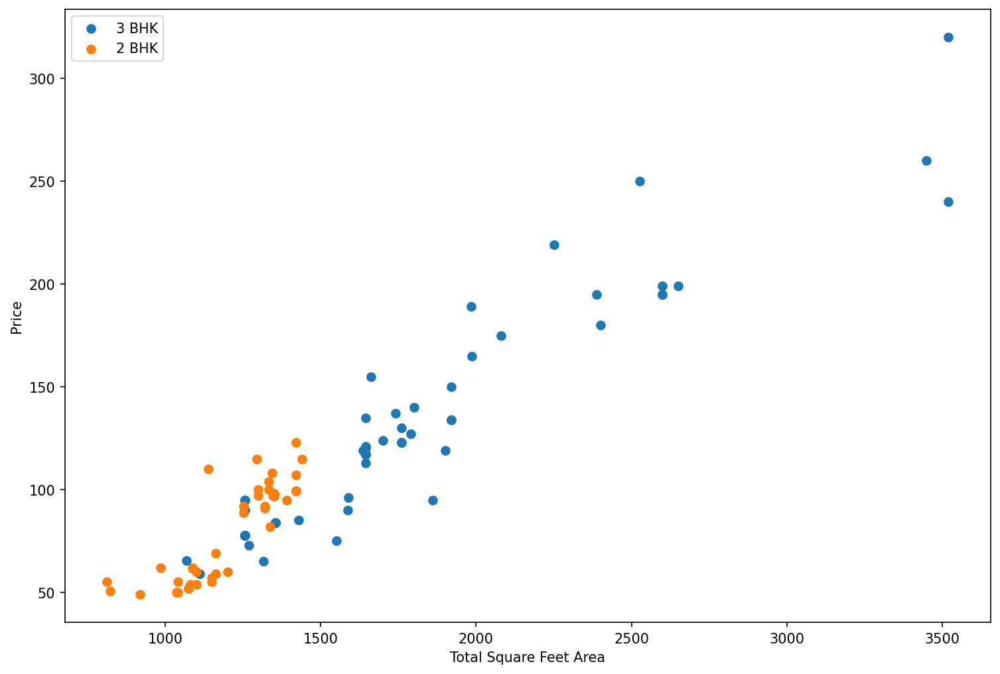

In [41]:
scatter_p(df5,'Hebbal')

In [42]:
def remove_bhk_outliers(df):
    exclude_indices=np.array([])
    for location, location_df in df.groupby('location'):
        bhk_stat={}
        for bhk, bhk_df in df.groupby('bhk'):
            bhk_stat[bhk]= {
                    'mean':np.mean(bhk_df['price_per_sqft']),
                    'std':np.std(bhk_df['price_per_sqft']),
                    'count':bhk_df.shape[0]
                }
        for bhk,bhk_df in df.groupby('bhk'):
            stats=bhk_stat.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
    return df.drop(exclude_indices,axis=0)

In [43]:
df6=remove_bhk_outliers(df5)

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users

C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users\choth\AppData\Local\Temp\ipykernel_19332\1655622105.py:14: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  exclude_indices=np.append(exclude_indices, bhk_df[df['price_per_sqft']<(stats['mean'])].index.values)
C:\Users

In [44]:
df6.shape

(5326, 7)

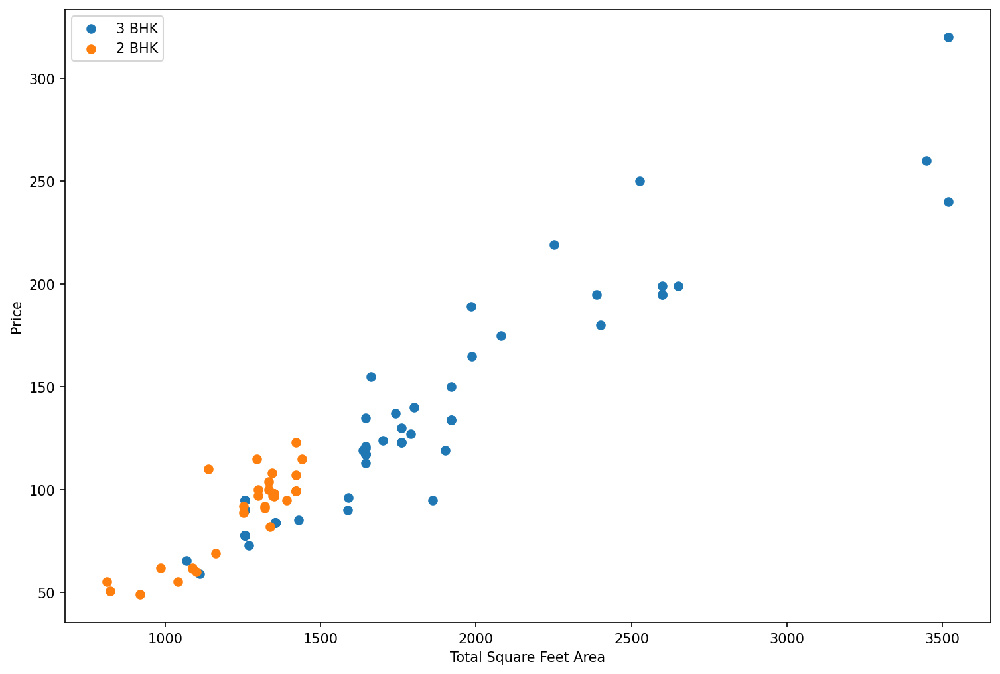

In [45]:
scatter_p(df6,'Hebbal')

<Axes: xlabel='price_per_sqft', ylabel='Count'>

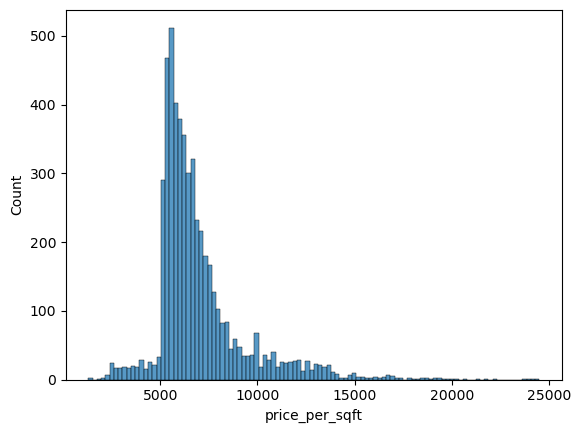

In [46]:
sns.histplot(data=df6,x='price_per_sqft')

In [47]:
df6[df6['bath']>df6['bhk']+2]

,location,size,total_sqft,bath,price,bhk,price_per_sqft
5234,Nagasandra,4 Bedroom,7000.0,8.0,450.0,4.0,6428.571429
6705,Thanisandra,3 BHK,1806.0,6.0,116.0,3.0,6423.034330
8401,others,6 BHK,11338.0,9.0,1000.0,6.0,8819.897689


In [48]:
df7=df6[df6['bath']<df6['bhk']+2]

In [49]:
df7.shape

(5260, 7)

In [50]:
dummies=pd.get_dummies(df7['location'])
dummies

,1st Block Jayanagar,1st Phase JP Nagar,2nd Stage Nagarbhavi,5th Block Hbr Layout,5th Phase JP Nagar,6th Phase JP Nagar,7th Phase JP Nagar,8th Phase JP Nagar,9th Phase JP Nagar,AECS Layout,...,Vidyaranyapura,Vijayanagar,Vishveshwarya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yeshwanthpur,others
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
7,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
8,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
10,0,1,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [51]:
df11=pd.concat([df7,dummies.drop('others', axis=1)],axis=1)

In [52]:
df11.shape

(5260, 225)

In [53]:
df11

,location,size,total_sqft,bath,price,bhk,price_per_sqft,1st Block Jayanagar,1st Phase JP Nagar,2nd Stage Nagarbhavi,...,Varthur,Vidyaranyapura,Vijayanagar,Vishveshwarya Layout,Vittasandra,Whitefield,Yelachenahalli,Yelahanka,Yelahanka New Town,Yeshwanthpur
0,1st Block Jayanagar,4 BHK,2850.000,4.0,428.000,4.0,15017.543860,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,1st Block Jayanagar,3 BHK,1630.000,3.0,194.000,3.0,11901.840491,1,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1st Block Jayanagar,3 BHK,1875.000,2.0,235.000,3.0,12533.333333,1,0,0,...,0,0,0,0,0,0,0,0,0,0
3,1st Block Jayanagar,3 BHK,1200.000,2.0,130.000,3.0,10833.333333,1,0,0,...,0,0,0,0,0,0,0,0,0,0
4,1st Block Jayanagar,2 BHK,1235.000,2.0,148.000,2.0,11983.805668,1,0,0,...,0,0,0,0,0,0,0,0,0,0
5,1st Block Jayanagar,4 BHK,2750.000,4.0,413.000,4.0,15018.181818,1,0,0,...,0,0,0,0,0,0,0,0,0,0
6,1st Block Jayanagar,4 BHK,2450.000,4.0,368.000,4.0,15020.408163,1,0,0,...,0,0,0,0,0,0,0,0,0,0
7,1st Phase JP Nagar,4 BHK,2825.000,4.0,250.000,4.0,8849.557522,0,1,0,...,0,0,0,0,0,0,0,0,0,0
8,1st Phase JP Nagar,3 BHK,1875.000,3.0,167.000,3.0,8906.666667,0,1,0,...,0,0,0,0,0,0,0,0,0,0
10,1st Phase JP Nagar,3 BHK,2065.000,4.0,210.000,3.0,10169.491525,0,1,0,...,0,0,0,0,0,0,0,0,0,0


In [66]:
X=df11.drop(['price','price_per_sqft','location','size'],axis=1)
y=df11['price']

In [67]:
from sklearn.model_selection import train_test_split

In [68]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=10)

In [69]:
from sklearn.linear_model import LinearRegression

In [70]:
lr_model=LinearRegression()

In [71]:
lr_model.fit(X_train,y_train)

LinearRegression()

In [72]:
from sklearn.model_selection import ShuffleSplit
from sklearn.model_selection import cross_val_score

In [73]:
cv= ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
cross_val_score(LinearRegression(),X,y,cv=cv)

array([ 7.58717414e-01,  8.81579706e-01, -9.41399034e+13,  8.01836590e-01,
       -7.17154273e+13])

In [78]:
def price_predict(location,sqft,bhk,bath):
    loc_index=np.where(X.columns==location)[0][0]
    
    x=np.zeros(len(X.columns))
    x[0]=sqft
    x[1]=bath
    x[2]=bhk
    
    if loc_index>=0:
        x[loc_index]=1
        
    return lr_model.predict([x])[0]

In [79]:
price_predict('1st Phase JP Nagar',1000,4,2) 

C:\Users\choth\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


90.20209915211726

In [87]:
price_predict('Indira Nagar',1000,8,4 ) 

C:\Users\choth\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py:465: UserWarning: X does not have valid feature names, but LinearRegression was fitted with feature names
  warnings.warn(


175.75514813804907

In [81]:
import pickle

In [82]:
with open('banglore_home _price.pkl','wb') as f:
    pickle.dump(lr_model,f)

In [83]:
import json
columns={
    'data_columns':[col.lower() for col in X.columns]
}

with open("columns.json", "w") as f:
    f.write(json.dumps(columns))

In [85]:
import joblib

In [86]:
joblib.dump(lr_model,'banglore_home _price.joblib')

['banglore_home _price.joblib']